In [1]:
import os
from ultralytics import YOLO
import random
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from pycocotools.coco import COCO
import numpy as np

In [2]:
# t16_best = YOLO('runs/segment/train16/weights/best.pt')
# t16_last = YOLO('runs/segment/train16/weights/last.pt')
predict_model_20 = YOLO('runs/segment/train20/weights/best.pt')
predict_model_22 = YOLO('runs/segment/train22/weights/best.pt')

In [3]:
test_coco = COCO('./datasets/DatasetCocoFormat1200/annotations/test.json')

loading annotations into memory...
Done (t=0.09s)
creating index...
index created!


In [4]:
image_ids = [1014910, 1085451, 820315, 994162, 1014824, 1092485]
print(image_ids)
imgs = test_coco.loadImgs(image_ids)
print()

[1014910, 1085451, 820315, 994162, 1014824, 1092485]




image 1/1 D:\University\RDD_YOLO\datasets\DatasetCocoFormat1200\test\1014910_RS_386_386RS124739_31475_RAW.jpg: 416x640 3 cracks, 58.3ms
Speed: 73.0ms preprocess, 58.3ms inference, 855.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\University\RDD_YOLO\datasets\DatasetCocoFormat1200\test\1014910_RS_386_386RS124739_31475_RAW.jpg: 416x640 1 crack, 32.0ms
Speed: 1.0ms preprocess, 32.0ms inference, 11.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\University\RDD_YOLO\datasets\DatasetCocoFormat1200\test\1085451_DF_080_080BDF0090_03644_RAW.jpg: 416x640 3 cracks, 28.0ms
Speed: 2.0ms preprocess, 28.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\University\RDD_YOLO\datasets\DatasetCocoFormat1200\test\1085451_DF_080_080BDF0090_03644_RAW.jpg: 416x640 2 cracks, 27.0ms
Speed: 2.0ms preprocess, 27.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 D:\University\RDD_YOLO\datasets\DatasetCocoFormat120

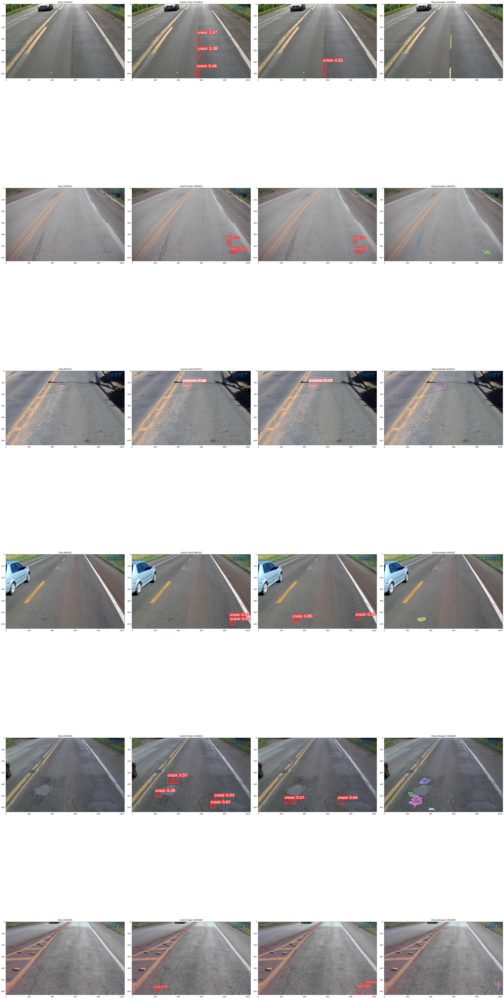

In [5]:
%matplotlib inline

# test_imgs = os.listdir('./datasets/optim/test/images/')
# random.shuffle(test_imgs)
# imgs = test_imgs[:6]
_,axs = plt.subplots(len(imgs),4,figsize=(40,15 * len(imgs)))
_.subplots_adjust(left=0.05, bottom=0.05, right=0.5, top=0.5, wspace=0.2, hspace=0.2)
# _,axs = plt.subplots(len(imgs),1,figsize=(40,15 * len(imgs)))
for img, ax in zip(imgs, axs):
    img_pth = os.path.join(os.path.relpath('./datasets/DatasetCocoFormat1200/test/'), img['file_name'])
    I = Image.open(img_pth)

    # img_id = int(img.split("_")[0])
    # annIds = test_coco.getAnnIds(imgIds=[img_id])
    annIds = test_coco.getAnnIds(imgIds=[img['id']])
    anns = test_coco.loadAnns(annIds)

    res_model_20 = predict_model_20.predict(img_pth, iou=0.1)
    res0_model_20 = res_model_20[0]
    plotted_model_20 = res0_model_20.plot(labels=True, boxes=True, masks=True, probs=True)
    img_pltd_model_20 = cv2.cvtColor(plotted_model_20, cv2.COLOR_BGR2RGB)

    res_model_22 = predict_model_22.predict(img_pth, iou=0.1)
    res0_model_22 = res_model_22[0]
    plotted_model_22 = res0_model_22.plot(labels=True, boxes=True, masks=True, probs=True)
    img_pltd_model_22 = cv2.cvtColor(plotted_model_22, cv2.COLOR_BGR2RGB)

    # res_t16_best = t16_best.predict(img_pth, iou=0.1)
    # res0_t16_best = res_t16_best[0]
    # plotted_t16_best = res0_t16_best.plot(labels=True, boxes=True, masks=True, probs=True)
    # img_pltd_t16_best = cv2.cvtColor(plotted_t16_best, cv2.COLOR_BGR2RGB)
    #
    # res_t16_last = t16_last.predict(img_pth, iou=0.1)
    # res0_t16_last = res_t16_last[0]
    # plotted_t16_last = res0_t16_last.plot(labels=True, boxes=True, masks=True, probs=True)
    # img_pltd_t16_last = cv2.cvtColor(plotted_t16_last, cv2.COLOR_BGR2RGB)

    ax[0].imshow(I)
    ax[0].set_title("Orig "+str(img['id']))
    ax[1].imshow(img_pltd_model_20)
    ax[1].set_title("train20 best "+str(img['id']))
    ax[2].imshow(img_pltd_model_22)
    ax[1].set_title("train22 best "+str(img['id']))
    # ax[1].imshow(img_pltd_t16_best)
    # ax[1].set_title("t16_best "+str(img['id']))
    # ax[2].imshow(img_pltd_t16_last)
    # ax[2].set_title("t16_last "+str(img['id']))
    ax[3].imshow(I)
    ax[3].set_title("Orig w/masks "+str(img['id']))
    plt.sca(ax[3])
    test_coco.showAnns(anns, draw_bbox=False)
    # ax.imshow(img_pltd)
    # plt.sca(ax)
plt.tight_layout()
plt.show()

**Проверка на видео**

In [7]:
# %matplotlib inline

TEST_VIDEO_PTH = os.path.abspath("D:\\University\\АД\\Кузьмичи\\18 ОП РЗ 18К-01-16 (обратное направление).avi")
cap = cv2.VideoCapture(TEST_VIDEO_PTH)

while True:
    ret, frame = cap.read()
    if ret:
        results = predict_model_20(frame, iou=0.3)
        # results = t16_best(frame, iou=0.2)
        annotated_frame = results[0].plot(labels=True, boxes=True, masks=True, probs=True)
        cv2.imshow("RDD Inference", annotated_frame)
        if cv2.waitKey(25) & 0xFF == ord('q') or ret==False:
            break
cap.release()
cv2.destroyAllWindows()


0: 448x768 1 crack, 145.2ms
Speed: 4.0ms preprocess, 145.2ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 33.0ms
Speed: 3.0ms preprocess, 33.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 32.0ms
Speed: 2.0ms preprocess, 32.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 30.0ms
Speed: 2.0ms preprocess, 30.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 29.0ms
Speed: 3.0ms preprocess, 29.0ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 29.0ms
Speed: 2.0ms preprocess, 29.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 28.0ms
Speed: 3.0ms preprocess, 28.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)

0: 448x768 1 crack, 29.0ms
Speed: 2.0ms preprocess, 29.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768